In [1]:
# Import Librarys

# Basic Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pprint import pprint
from matplotlib import pyplot
import yfinance as yf
import random
import pandas_market_calendars as mcal

#LPPLS Model library -> in anacondapromt use following install code: pip install lppls
from lppls import lppls# 

#Import Plotting Librarys
import matplotlib.pyplot as plt


from sklearn.preprocessing import MinMaxScaler
#plot size
plt.rcParams['figure.figsize'] = (20, 10)

#Data vizualization
%matplotlib inline
import seaborn as sns


# Machine Learning Imports
from sklearn.ensemble import RandomForestClassifier 
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.metrics import RocCurveDisplay, roc_auc_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.inspection import permutation_importance
from tabulate import tabulate
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from sklearn.preprocessing import StandardScaler

# Load Label / Features and plot some importent statistics

In [2]:
features = pd.read_csv('model_features.csv')
features['vix_change'] =features['vix'].pct_change()
features = features.dropna()
features

,Date,Close,Log_Returns,RSI,K_percent,MACD,ROC,btc_no_transactions_change,GEPUPPP,vix,...,fed_fund_eff_rate,volume_mined_sum_pct_change,hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter_change,Volume_change,SP_GSCI_Energy_Tot_Ret,SP_GSCI_Gold_Tot_Ret,SP_Global_BMI_Tot_Ret,Pred_Signal,vix_change
1,2015-07-03,256.335999,0.003611,62.511035,58.072117,5.770135,0.065780,-0.065499,128.857764,16.845,...,0.13,0.045455,0.037984,5.231006e-04,-0.116839,0.000000,0.000000,-0.002245,0.0,0.003276
2,2015-07-04,260.885986,0.017594,68.617634,74.616325,6.052054,0.074494,-0.215890,128.857764,16.900,...,0.13,-0.055901,-0.045281,5.228271e-04,-0.179334,-0.024780,0.002781,-0.003386,0.0,0.003265
3,2015-07-05,271.912994,0.041399,78.320490,92.404976,7.083609,0.116255,0.491840,128.857764,16.955,...,0.13,-0.065789,-0.083265,5.225539e-04,1.826823,-0.025410,0.002773,-0.003398,0.0,0.003254
4,2015-07-06,269.029999,-0.010659,71.887372,77.353806,7.581100,0.071875,0.147152,128.857764,17.010,...,0.13,0.274648,0.278871,5.222810e-04,0.113205,-0.026072,0.002765,-0.003409,0.0,0.003244
5,2015-07-07,266.207001,-0.010549,65.722761,69.735815,7.659281,0.069057,0.151376,128.857764,16.090,...,0.13,-0.259669,-0.255988,6.073685e-03,-0.412924,-0.002375,-0.017555,-0.004059,0.0,-0.054086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2803,2023-03-05,22435.513672,0.003669,35.359579,8.078675,1.142890,-0.032874,-0.064192,264.330834,18.570,...,4.57,0.019737,0.024760,-7.126669e-04,0.192637,-0.000518,0.000133,0.000680,0.0,0.002159
2804,2023-03-06,22429.757812,-0.000257,35.267357,7.882087,-52.088259,-0.032173,0.102492,264.330834,18.610,...,4.57,-0.148387,-0.169201,-7.131752e-04,0.303086,-0.000518,0.000133,0.000680,0.0,0.002154
2805,2023-03-07,22219.769531,-0.009406,31.777620,8.142203,-109.951179,-0.056934,0.145771,264.330834,19.590,...,4.57,0.250000,0.250673,7.807129e-03,0.311888,-0.030179,-0.018524,-0.013115,0.0,0.052660
2806,2023-03-08,21718.080078,-0.022837,24.916690,0.350180,-194.053181,-0.076725,-0.192191,264.330834,19.110,...,4.57,-0.193939,-0.176546,-4.772233e-05,-0.010054,-0.012230,-0.000613,-0.000756,0.0,-0.024502


In [3]:
btc_close = features['Close'] # for plotting
date = features['Date']
btc_close.index = date

In [4]:
#create label
label = features['Pred_Signal']
label

1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
2803    0.0
2804    0.0
2805    0.0
2806    0.0
2807    0.0
Name: Pred_Signal, Length: 2807, dtype: float64

In [5]:
features = features.drop(['Close','Date','Pred_Signal'],axis = 1)


# Building the LPPLS Model

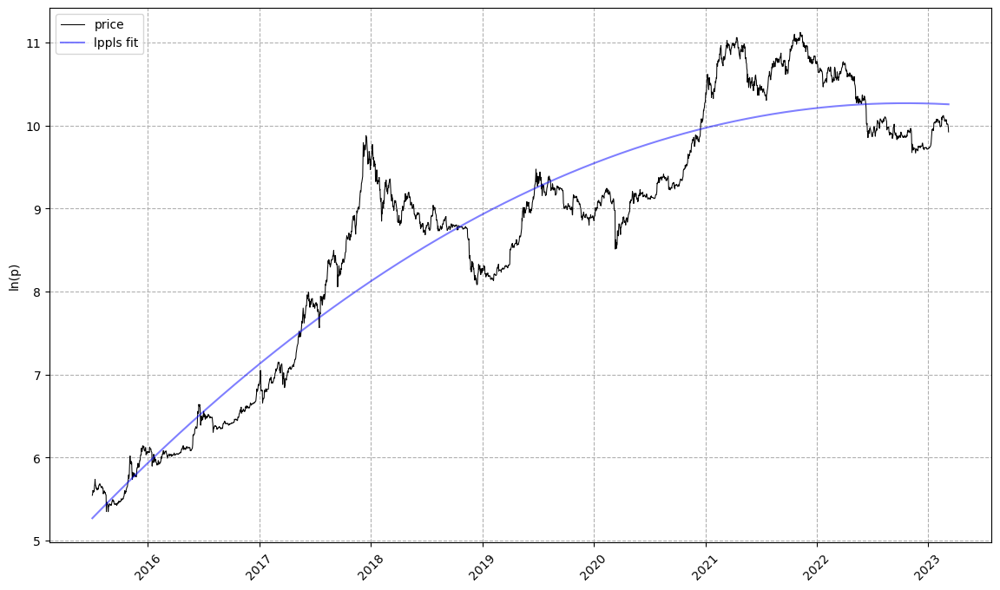

In [9]:
from lppls import lppls, data_loader
from datetime import datetime as dt
%matplotlib inline

# read example dataset into df 
data = btc_close

# convert time to ordinal
time = [pd.Timestamp.toordinal(dt.strptime(t1, '%Y-%m-%d')) for t1 in data.index]

# create list of observation data
price = np.log(data.values)

# create observations array (expected format for LPPLS observations)
observations = np.array([time, price])

# set the max number for searches to perform before giving-up
# the literature suggests 25
MAX_SEARCHES = 25

# instantiate a new LPPLS model with the Nasdaq Dot-com bubble dataset
lppls_model = lppls.LPPLS(observations=observations)

# fit the model to the data and get back the params
tc, m, w, a, b, c, c1, c2, O, D = lppls_model.fit(MAX_SEARCHES)

# visualize the fit
lppls_model.plot_fit()

100%|██████████████████████████████████████████████████████████████████████████████| 2718/2718 [08:13<00:00,  5.51it/s]


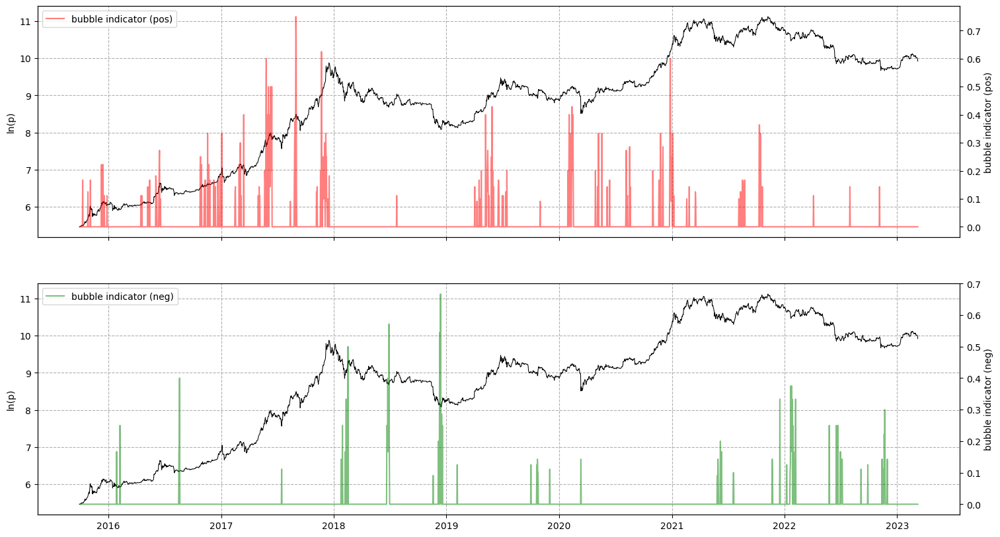

In [24]:
# compute the confidence indicator
# define custom filter condition
filter_conditions_config = [
    {'condition_1':[
        (0,0.2), # tc_range
        (0.01,0.99), # m_range
        (2,25), # w_range
        (2.5), # O_min
        (0.15), # D_min
    ]},]

res = lppls_model.mp_compute_nested_fits(
        workers=8,
        window_size=90,
        smallest_window_size=30,
        outer_increment=1,
        inner_increment=5,
        max_searches=25,
        filter_conditions_config=filter_conditions_config)

lppls_model.plot_confidence_indicators(res)

In [25]:
indicator = lppls_model.compute_indicators(res)

In [26]:
indicator.to_csv('C:/DJ Cap/Data/LPPS', index=True)

In [6]:
indicator = pd.read_csv('LPPS')

# Correlation Plot

In [7]:
# Assuming that features_new contains only the features you mentioned,
# and the target variable (peak indicator) is stored in a separate Series called `target`.

# Concatenate the features and the target variable into a single DataFrame
corr_dat = pd.concat([features, label], axis=1)

# Rename the target column to 'peak_indicator'
#corr_dat.rename(columns={'Signal': 'peak_indicator'}, inplace=True)

# Calculate the correlation matrix
correlation_matrix = corr_dat.corr(method='pearson')

# Get the correlation values for the target variable (peak_indicator)
correlation_with_target = correlation_matrix['Pred_Signal'].sort_values(ascending=False)

# Remove the peak_indicator itself from the list
correlation_with_target = correlation_with_target.drop('Pred_Signal')

# Print the correlation values for each feature
print(correlation_with_target)


ROC                                 0.363025
RSI                                 0.345816
K_percent                           0.283518
MACD                                0.211718
Log_Returns                         0.144702
Volume_change                       0.031101
SP_GSCI_Gold_Tot_Ret                0.025532
wiki                                0.025067
btc_no_transactions_change          0.015697
vix_change                          0.012016
hash_rate_mean_pct_change           0.011967
SP_Global_BMI_Tot_Ret               0.011263
volume_mined_sum_pct_change         0.010117
SP_GSCI_Energy_Tot_Ret              0.006789
Nom_Broad_USD_Index_inter_change   -0.017504
fed_fund_eff_rate                  -0.053724
GEPUPPP                            -0.122625
vix                                -0.177177
Name: Pred_Signal, dtype: float64


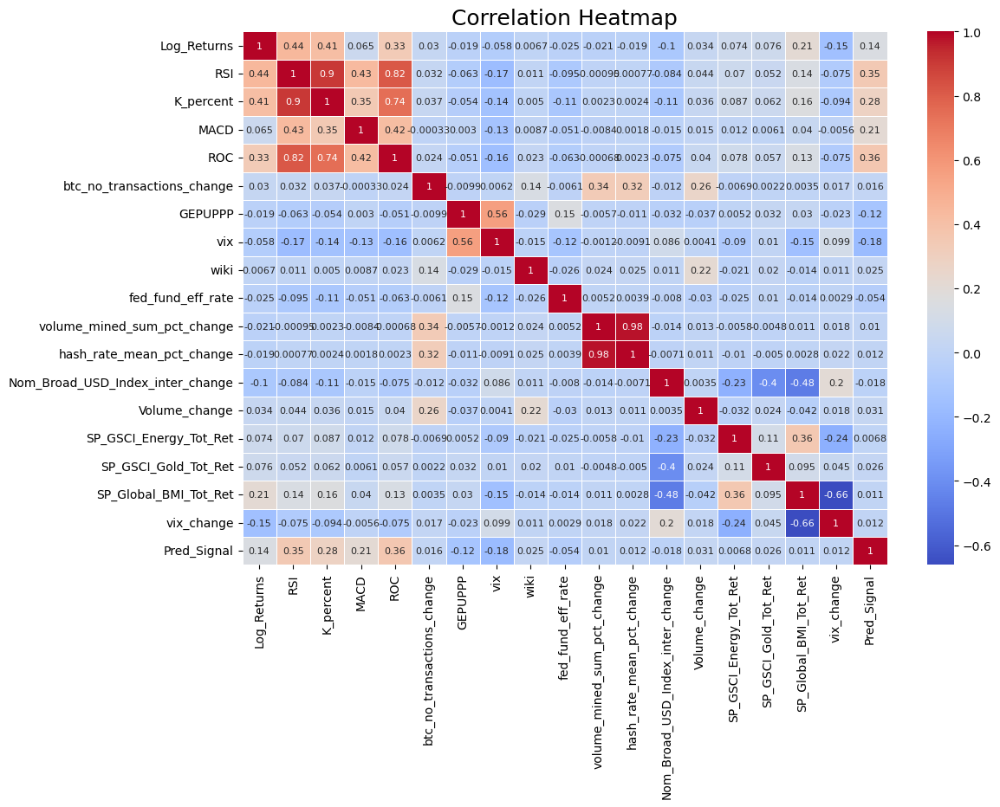

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt


# Create a heatmap using Seaborn with bigger font size
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 8})

# Set the title of the heatmap
plt.title('Correlation Heatmap', fontsize=18)

# Set the font size for the axes labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Rotate the x-axis labels to be horizontal
plt.xticks(rotation=90)

# Show the plot
plt.show()


In [9]:
# Find the features with a correlation greater than 0.5:
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.4:
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)

# Exclude 'peak_indicator' from highly_correlated_features
if 'peak_indicator' in highly_correlated_features:
    highly_correlated_features.remove('peak_indicator')


In [10]:
highly_correlated_features

{'K_percent',
 'MACD',
 'ROC',
 'RSI',
 'SP_GSCI_Gold_Tot_Ret',
 'SP_Global_BMI_Tot_Ret',
 'hash_rate_mean_pct_change',
 'vix',
 'vix_change'}

In [11]:
#Remove the highly correlated features from the DataFrame:
#old features: hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter,volume_mined_sum_pct_change,fed_fund_eff_rate
# wiki,vix,Log_Returns,stoch_ostzillator,volume_sum_change
# 	Log_Returns 	K_percent 	ROC 	GEPUPPP 	wiki 	Nom_Broad_USD_Index_inter_change 	vix_change

features_filtered = features.drop(columns=['ROC','MACD','vix_change','fed_fund_eff_rate','SP_GSCI_Gold_Tot_Ret','RSI','SP_Global_BMI_Tot_Ret','btc_no_transactions_change','volume_mined_sum_pct_change','vix','SP_GSCI_Energy_Tot_Ret'])

features_filtered

,Log_Returns,K_percent,GEPUPPP,wiki,hash_rate_mean_pct_change,Nom_Broad_USD_Index_inter_change,Volume_change
1,0.003611,58.072117,128.857764,-0.152520,0.037984,5.231006e-04,-0.116839
2,0.017594,74.616325,128.857764,0.077043,-0.045281,5.228271e-04,-0.179334
3,0.041399,92.404976,128.857764,-0.028501,-0.083265,5.225539e-04,1.826823
4,-0.010659,77.353806,128.857764,0.180741,0.278871,5.222810e-04,0.113205
5,-0.010549,69.735815,128.857764,0.093248,-0.255988,6.073685e-03,-0.412924
...,...,...,...,...,...,...,...
2803,0.003669,8.078675,264.330834,-0.132182,0.024760,-7.126669e-04,0.192637
2804,-0.000257,7.882087,264.330834,0.144743,-0.169201,-7.131752e-04,0.303086
2805,-0.009406,8.142203,264.330834,0.076356,0.250673,7.807129e-03,0.311888
2806,-0.022837,0.350180,264.330834,-0.089201,-0.176546,-4.772233e-05,-0.010054


Robust explanatory power of internal factors 
- number of transactions, 
- number of bitcoins mined, 
- hash rates, 
- trading volume, 
- realized volatility of Bitcoin prices

public interest factors:
- (Wikipedia views)
- global macroeconomic and financial factors (stock markets, energy markets, gold markets, investors’ 
  fear gauge
- economic policy uncertainty
- effective federal funds rate
- trade-weighted US dollar index

## ------------------------------------------------------------

In [12]:
#split in train and test data

X_train, X_test, y_train, y_test = train_test_split(features_filtered,label, test_size=0.20, shuffle=False)

# Split the data in a 80%, 20% proportion
print('Features lenght = ',len(features_filtered))
print('Label lenght = ',len(label))
print()
print('X_train lenght = ',len(X_train))
print('y_train lenght = ',len(y_train))
print('X_test lenght = ',len(X_test))
print('y_test lenght = ',len(y_test))

print('Backtesting x = ',len(X_train)+len(X_test))
print('Backtesting y = ',len(y_train)+len(y_test))

Features lenght =  2807
Label lenght =  2807

X_train lenght =  2245
y_train lenght =  2245
X_test lenght =  562
y_test lenght =  562
Backtesting x =  2807
Backtesting y =  2807


# ----------------------------------------------------

1. 
- synthetische bubbels generieren. (daten normaisieren) evtl. von anderen cryptos bubbels nehmen.
- wichtig, immer nur auf bitcoin daten testen. 
Risiken: andere kurse, weniger stabil

2. oversampling verwenden nur aufs label bezogen (generieren daten die das label 1 haben) 
- evtl. smote (generiert künstliche daten). Daten genereiren mit label 1. 
- ziehen mit zurücklegen 
- !!!!!Testen auf den richtigen Daten!!!!!

3. Data Argumentation technik googeln. Evtl hilfts. 

Problem Unbalanzierte lable klasse.

#Label evtl. noch information wann die letzte bubble war anstatt nur laggen.


In [13]:
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import ADASYN
import xgboost as xgb


#Grid: https://xgboost.readthedocs.io/en/stable/parameter.html

def xgboost_classification_balanced(features, labels, test_size=int):
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=test_size, shuffle=False)

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Apply ADASYN to balance the dataset
    adasyn = ADASYN(random_state=8)
    X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, np.ravel(y_train))

    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start=10, stop=2000, num=20)]

    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(1, 301, num=10)]
    max_depth.append(None)

    # Step size shrinkage used in update to prevents overfitting.
    learning_rate = [0.001, 0.01, 0.1, 1]

    # Minimum number of samples required at each leaf node
    min_samples_leaf = list(range(1, 301,5))
    
    # min_child_weight range: [0,∞]
    min_child_weight = np.arange(0, 1, 0.05).tolist()
    
    #Subsample: Subsample ratio of the training instances.
    subsample = np.arange(0, 1.01, 0.05).tolist()# old:  np.arange(0.01, 1.01, 0.05).tolist()
    
    #colsample_bytree: is the subsample ratio of columns when constructing each tree. 
    colsample_bytree = np.arange(0.01, 1.01, 0.05).tolist()
    
    #scale_pos_weight: label wheights
    neg_instances = np.sum(y_train_resampled == 0) #class 0
    pos_instances = np.sum(y_train_resampled == 1) #class 1
    scale_pos_weight_value = neg_instances / pos_instances
    scale_pos_weight = [scale_pos_weight_value]

    
    #gamma:Minimum loss reduction required to make a further partition on a leaf node of the tree.
    gamma = [i/10.0 for i in range(0,5)]

    #regaular alpha reg_alpha provides l1 regularization to the weight, higher values result in more conservative models
    #reg_alpha =  [1e-5, 1e-2, 0.1, 1, 10, 100]
    
    ## reg_lambda provides l2 regularization to the weight, higher values result in more conservative models
    reg_lambda = [1e-5, 1e-2, 0.1, 1, 10, 100]
    
    #valuation metrics for validation data
    eval_metric = ['auc','rmsle','rmse','merror'] #'rmsle','rmse',,'merror'
    
    #objective: Specify the learning task and the corresponding learning objective
    objective = ['binary:logistic'] #, 'binary:logitraw','binary:hinge'
    
    # Grid search parameters https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
    params = {
        'objective': objective,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'colsample_bytree': colsample_bytree,
        'n_estimators': n_estimators,
        'gamma': gamma,
        'reg_lambda': reg_lambda, #'reg_alpha':reg_alpha,
        'scale_pos_weight': scale_pos_weight,
        'eval_metric': eval_metric
    }
    
    
    # First create the base model to tune    
    xgb_model = xgb.XGBClassifier(random_state=8)
    
    # Define the number of folds
    n_splits = 10
    
    # Create the cross-validation object
    cv = StratifiedKFold(n_splits=n_splits, shuffle=False)
    
    #Random search of parameters, using 10 folds StratifiedKFold cross validation,
    xgb_random = RandomizedSearchCV(estimator=xgb_model, param_distributions=params, n_iter=250,
                                   cv=cv, verbose=1, random_state=8, n_jobs=-1, scoring='balanced_accuracy')
    
    # Fit the random search model
    xgb_random.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    # Get the best parameters from the RandomizedSearchCV
    best_params = xgb_random.best_params_
    
    # Create a XGBoost Classifier with the Hyperparameters from the Tuning
    xgb_clf = xgb.XGBClassifier(**best_params, random_state=8)

    # Fit the data to the model
    xgb_clf.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    # Make predictions
    y_pred = xgb_clf.predict(X_test)

    return y_pred, best_params, xgb_clf, y_test, X_train_resampled, y_train_resampled


In [14]:
y_pred_xg, best_params, xgb_clf, y_test, X_train_resampled, y_train_resampled = xgboost_classification_balanced(features_filtered, label, test_size=0.2)

Fitting 10 folds for each of 250 candidates, totalling 2500 fits


In [15]:
y_pred_xg_backup = pd.DataFrame(y_pred_xg)
y_pred_xg_backup.to_csv('XGBOOST_PRED_SIGNALS')

In [16]:
#y_pred_xg = pd.read_csv('XGBOOST_PRED_SIGNALS')

In [28]:
best_params

{'subsample': 0.2,
 'scale_pos_weight': 1.005050505050505,
 'reg_lambda': 1e-05,
 'objective': 'binary:logistic',
 'n_estimators': 2000,
 'min_child_weight': 0.15000000000000002,
 'max_depth': 234,
 'learning_rate': 0.01,
 'gamma': 0.3,
 'eval_metric': 'auc',
 'colsample_bytree': 0.8600000000000001}

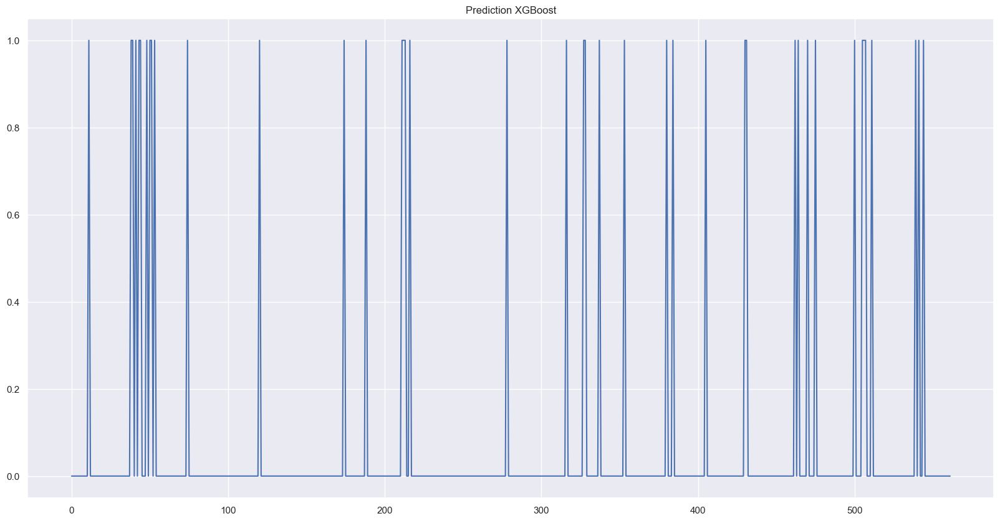

In [62]:
plt.plot(y_pred_xg)
plt.title('Prediction XGBoost');

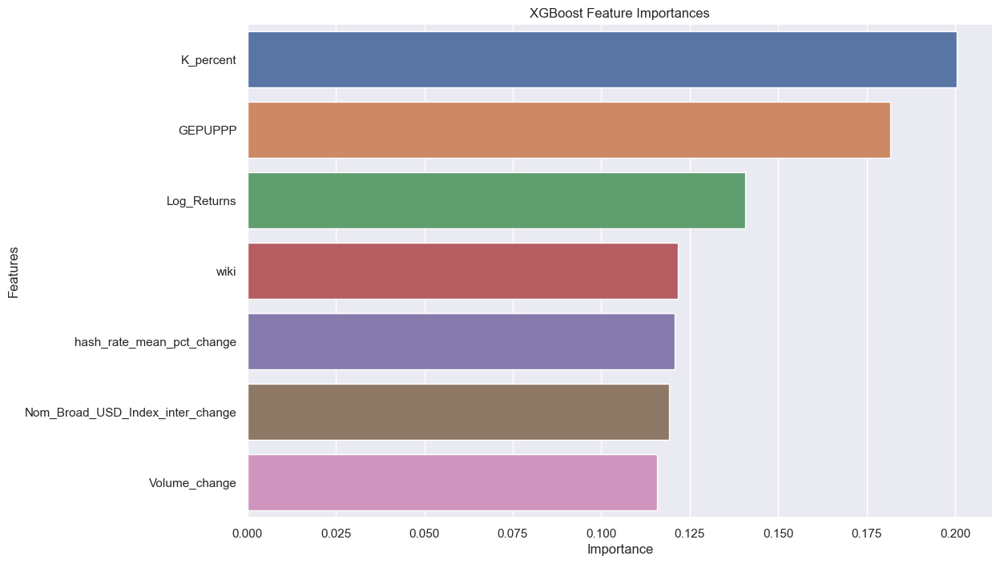

In [58]:
#XGBoost Features Importance
importance = xgb_clf.feature_importances_
importance_df = pd.DataFrame({"Features": features_filtered.columns, "Importances": importance})
importance_df = importance_df.sort_values('Importances', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importances', y='Features', data=importance_df)
plt.title('XGBoost Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [59]:
importance_df

,Features,Importances
1,K_percent,0.200471
2,GEPUPPP,0.181589
0,Log_Returns,0.140580
3,wiki,0.121606
4,hash_rate_mean_pct_change,0.120771
5,Nom_Broad_USD_Index_inter_change,0.119214
6,Volume_change,0.115768


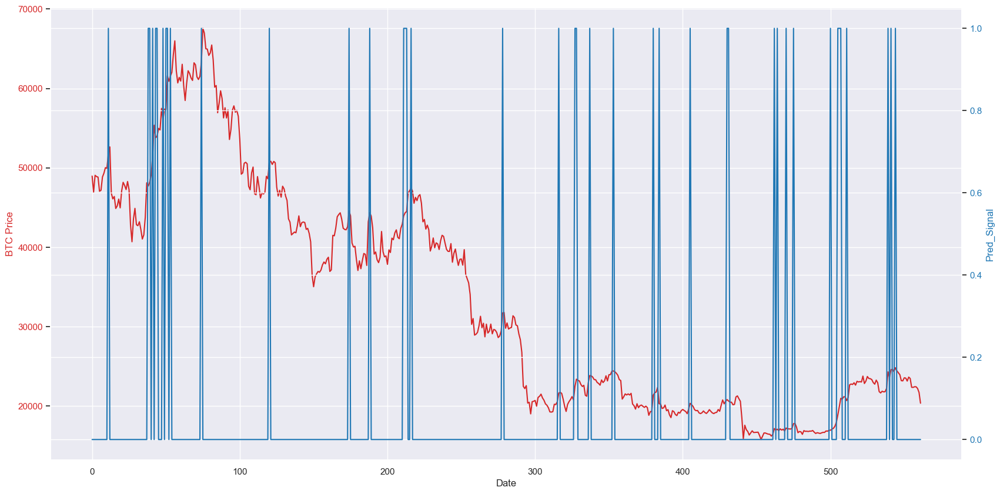

In [31]:
#prepare the data
data = btc_close
data = data.reset_index()
data = data.drop(['Date'],axis=1)
data = data[len(data)-len(y_test):]

data = data.reset_index()


plt.rcParams['figure.figsize'] = (20, 10)
# Set the seaborn style
sns.set(style="darkgrid")

# Create the plot figure and axes
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('BTC Price', color=color)
ax1.plot(data['Close'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Pred_Signal', color=color)  
ax2.plot(y_pred_xg, color=color)
ax2.tick_params(axis='y', labelcolor=color)

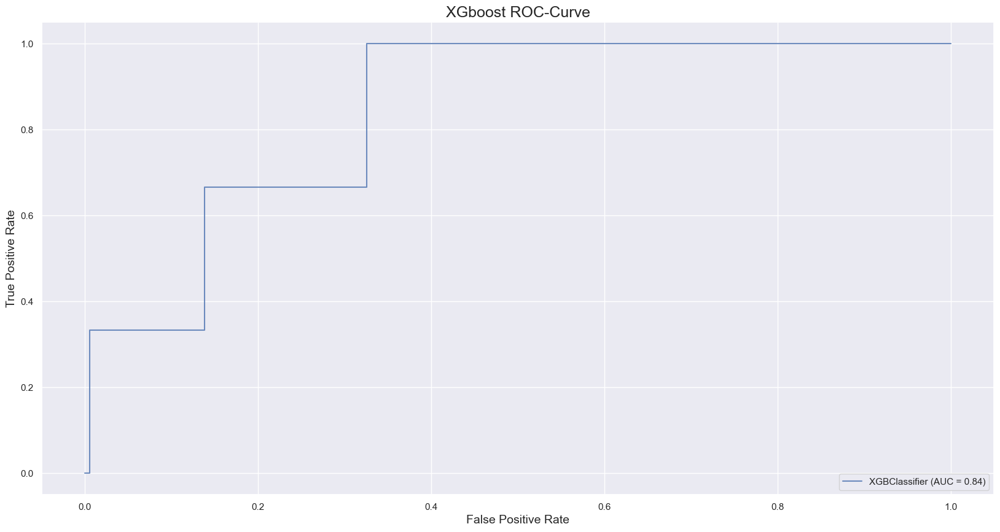

In [32]:
# Create an ROC Curve plot.
rfc_disp = RocCurveDisplay.from_estimator(xgb_clf, X_test, y_test, alpha = 0.8) 
plt.title('XGboost ROC-Curve', fontsize=18)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.show()


In [33]:
def mae_metric(actual, predicted):
    if isinstance(actual, pd.DataFrame) or isinstance(actual, pd.Series):
        actual = actual.to_numpy().flatten()
    if isinstance(predicted, pd.DataFrame) or isinstance(predicted, pd.Series):
        predicted = predicted.to_numpy().flatten()

    sum_error = 0.0
    for i in range(len(actual)):
        prediction_error = abs(predicted[i] - actual[i])
        sum_error += prediction_error
    mean_error = sum_error / float(len(actual))
    return mean_error



def rmse_metric(actual, predicted):
    if isinstance(actual, pd.DataFrame) or isinstance(actual, pd.Series):
        actual = actual.to_numpy().flatten()
    if isinstance(predicted, pd.DataFrame) or isinstance(predicted, pd.Series):
        predicted = predicted.to_numpy().flatten()

    sum_error = 0.0
    for i in range(len(actual)):
        prediction_error = predicted[i] - actual[i]
        sum_error += (prediction_error ** 2)
    mean_error = sum_error / float(len(actual))
    return np.sqrt(mean_error)




In [34]:
# Print the Accuracy (Hit Ratio) of our Model.
print('Correct Prediction (Hit Ratio) % : ', accuracy_score(y_test, y_pred_xg, normalize = True) * 100.0)

# Checking performance our model with AUC Score.
y_pred_proba = xgb_clf.predict_proba(X_test)[:, 1]  # Get probabilities for the positive class
auc = roc_auc_score(y_test, y_pred_proba)
print('Area under the curve:', auc)


# Get the root mean squared error (RMSE)
print('RMSE = ' , rmse_metric(y_test, y_pred_xg))
# Don't forget the worst value in this case is 1! 

print('MAE = ' , mae_metric(y_test, y_pred_xg))
 

Correct Prediction (Hit Ratio) % :  92.52669039145907
Area under the curve: 0.8437686344663089
RMSE =  0.27337354679158193
MAE =  0.07473309608540925


Area under the curve (AUC): 0.606 - The AUC value is a measure of model performance in binary classification and ranges from 0 to 1. An AUC value of 0.5 means that the model is as good as guessing, while a value of 1 represents perfect classification. In this case, the AUC value is 0.606, indicating that the model is better than random guessing but still has significant room for improvement.

    Root Mean Square Error (RMSE): 0.273 - The RMSE is a measure of the average deviation of the model's predictions from the actual values. In this case, the RMSE is 0.273, which means that on average, the model's predictions differ from the actual values by 0.273 units. The lower the RMSE, the better the performance of the model. The RMSE value here is relatively low, indicating a good fit of the model to the data. However, this value should always be interpreted in the context of the problem and the size of the target area.

    Mean Absolute Error (MAE): 0.075 - The MAE is another measure of a model's predictive accuracy and indicates the average absolute difference between the model's predictions and the actual values. A lower MAE value indicates better performance of the model. In this case, the MAE is 0.075, indicating that the average absolute deviation of the model's predictions from the actual values is quite low. As with the RMSE, the MAE value should always be interpreted in the context of the problem and the size of the target area.

Overall, the values suggest that the model has some predictive power but that improvements are needed in the binary classification (AUC value). The regression evaluation metrics (RMSE and MAE) indicate that the model has a relatively good fit to the data, but again, interpretation depends on the specific requirements and context of the problem.



In [53]:
#Classifiaction Report

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred_xg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df = pd.DataFrame(report).transpose() 
report_df

,precision,recall,f1-score,support
0.0,0.996161,0.928444,0.961111,559.000000
1.0,0.024390,0.333333,0.045455,3.000000
accuracy,0.925267,0.925267,0.925267,0.925267
macro avg,0.510276,0.630888,0.503283,562.000000
weighted avg,0.990974,0.925267,0.956223,562.000000


The given classification report shows the performance of a classification model. Here is an analysis of the different metrics:

    Class 0:
        Precision: 0.988 - The model correctly identified 98.8% of the instances classified as class 0.
        Recall: 0.934 - The model identified 93.4% of the instances actually belonging to class 0.
        F1 Score: 0.961 - The F1 score is a harmonic mean of Precision and Recall and is 96.1%.
        Support: 549 - There are 549 instances of class 0 in the test data set.

    Class 1:
        Precision: 0.163 - The model correctly identified 16.3% of the instances classified as Class 1.
        Recall: 0.538 - The model identified 53.8% of the instances that actually belonged to class 1.
        F1 Score: 0.250 - The F1 score is 25.0%.
        Support: 13 - There are 13 instances of class 1 in the test data set.

    Accuracy: 0.925 - The model correctly classified 92.5% of the instances overall.

    Macro Average (average over all classes):
        Precision: 0.576
        Recall: 0.736
        F1 Score: 0.605
        Support: 562 - The total number of test records is 562.

    Weighted average (considering the number of instances per class):
        Precision: 0.969
        Recall: 0.925
        F1 Score: 0.944

Overall, the model shows high accuracy (92.5%) in classifying the test data. However, the performance for class 1 (Precision: 16.3% and Recall: 53.8%) is significantly worse than for class 0 (Precision: 98.8% and Recall: 93.4%). This could indicate an unbalanced data set or a model that has difficulty correctly identifying Class 1.



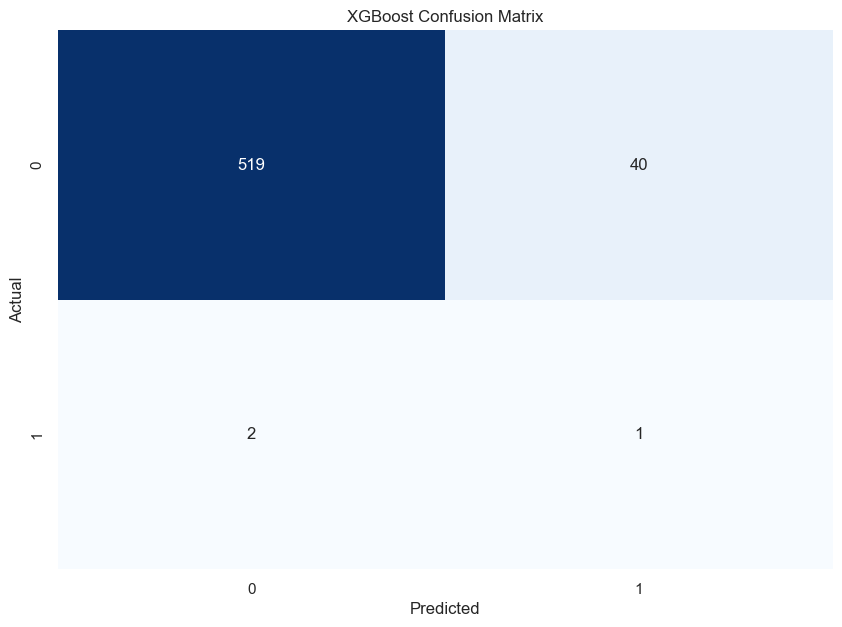

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_xg)

# Create a heatmap using seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('XGBoost Confusion Matrix')

# Display the plot
plt.show()


In [71]:
cm

array([[519,  40],
       [  2,   1]], dtype=int64)

# Robustness check

In [26]:
# k-fold cross validation evaluation of xgboost model
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Apply ADASYN to balance the dataset
adasyn = ADASYN(random_state=8)
X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, np.ravel(y_train))


kfold = 20
results = cross_val_score(xgb_clf, X_train_resampled, y_train_resampled, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 85.82% (7.02%)


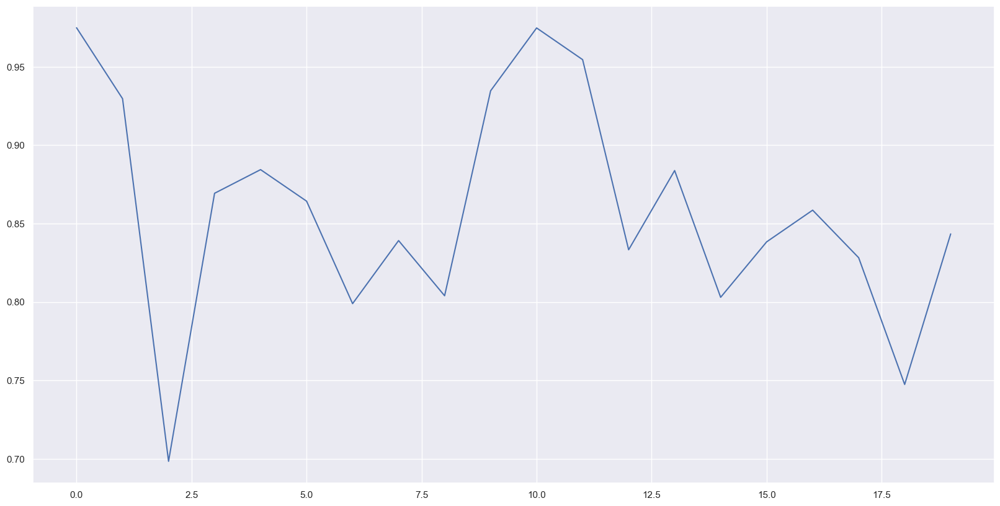

In [27]:
plt.plot(results);

# ----------------------------------------------------------------------

In [37]:
from imblearn.ensemble import BalancedRandomForestClassifier

In [38]:
def random_forest_classification_balanced(features, labels, test_size=int):
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=test_size, shuffle=False)

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Apply ADASYN to balance the dataset
    adasyn = ADASYN(random_state=8)
    X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, np.ravel(y_train))

    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start=10, stop=2000, num=10)]

    # Number of features to consider at every split
    max_features = ['sqrt', 'log2']

    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(1, 301, num=11)]
    max_depth.append(None)

    # Minimum number of samples required to split a node
    min_samples_split = list(range(2, 80))

    # Minimum number of samples required at each leaf node
    min_samples_leaf = list(range(1, 80))

    # Criterion
    criterion = ['gini', 'entropy']

    # Bootstrap grid
    bootstrap = [True]
    
    #class weights
    class_weight=['balanced']

    # Create the random grid
    random_grid = {'class_weight': class_weight,
                   'n_estimators': n_estimators,
                   'max_features': max_features,
                   'max_depth': max_depth,
                   'min_samples_split': min_samples_split,
                   'min_samples_leaf': min_samples_leaf,
                   'criterion': criterion,
                   'bootstrap': bootstrap}

    # First create the base model to tune
    rf = BalancedRandomForestClassifier()

    # Define the number of folds
    n_splits = 10

    # Create the cross-validation object
    cv = StratifiedKFold(n_splits=n_splits, shuffle=False) # nach papaer suchen welche cv verwendet werden in time series

    # Random search of parameters, using 2 fold cross validation,
    # search across 50 different combinations, and use 3 available cores
    rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid, n_iter=250,
                                   cv=cv, verbose=1, random_state=8, n_jobs=-1, scoring='balanced_accuracy')
    
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

    # Fit the random search model
    rf_random.fit(X_train_resampled, np.ravel(y_train_resampled))
    
    
    # Get the best parameters from the RandomizedSearchCV
    param = rf_random.best_params_
    
    

    # Create a Random Forest Regressor with the Hyperparameters from the Tuning
    rand_frst_clf = BalancedRandomForestClassifier(oob_score=True,
                                           class_weight='balanced',
                                           n_estimators=param['n_estimators'],
                                           min_samples_split=param['min_samples_split'],
                                           min_samples_leaf=param['min_samples_leaf'],
                                           max_features=param['max_features'],
                                           max_depth=param['max_depth'],
                                           criterion=param['criterion'],
                                           bootstrap=param['bootstrap'],
                                           random_state=8)

    # Fit the data to the model
    rand_frst_clf.fit(X_train_resampled, np.ravel(y_train_resampled))

   
    
    # Make predictions
    y_pred = rand_frst_clf.predict(X_test)

    # This is the Output command to see the best Parameters
    param = rf_random.best_params_

    return y_pred, param, rand_frst_clf,y_test


In [39]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

from sklearn.utils.parallel import delayed



# Using BalancedRandomForestClassifier
y_pred_balanced, param_balanced, rand_frst_clf_balanced, y_test = random_forest_classification_balanced(features_filtered, 
                                                                                                        label, 
                                                                                                        test_size = 0.2)
                                                                                                          


Fitting 10 folds for each of 250 candidates, totalling 2500 fits


C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureW

In [40]:
y_pred_balanced_backup = pd.DataFrame(y_pred_balanced)
y_pred_balanced_backup.to_csv('RF_PRED_SIGNALS.csv')

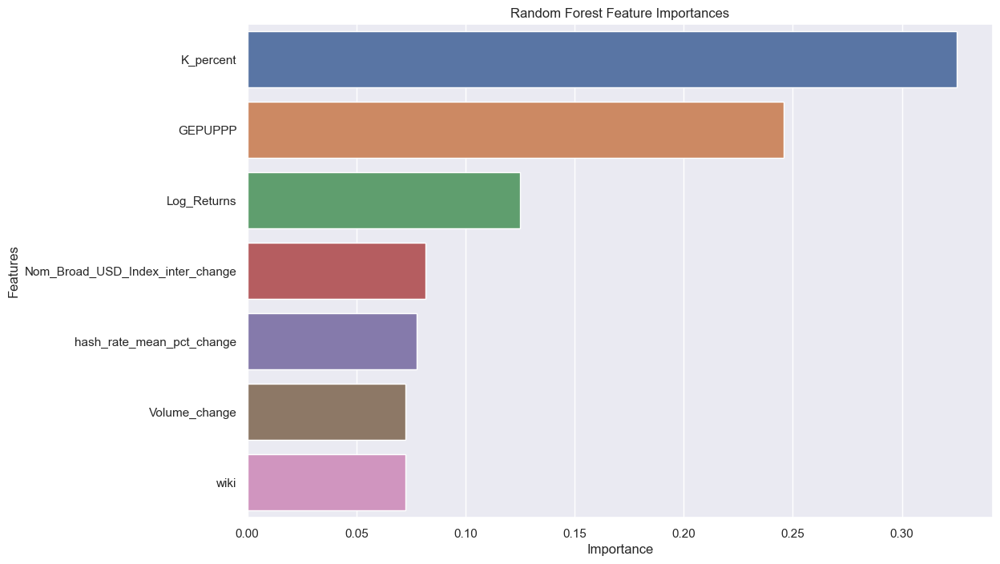

In [56]:
#Random Forest Features Importance
importance = rand_frst_clf_balanced.feature_importances_
importance_df = pd.DataFrame({"Features": features_filtered.columns, "Importances": importance})
importance_df = importance_df.sort_values('Importances', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importances', y='Features', data=importance_df)
plt.title('Random Forest Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

In [57]:
#logretruns, K_percent, GEPUPPP, 
importance_df

,Features,Importances
1,K_percent,0.325239
2,GEPUPPP,0.245714
0,Log_Returns,0.124955
5,Nom_Broad_USD_Index_inter_change,0.081524
4,hash_rate_mean_pct_change,0.077718
6,Volume_change,0.072457
3,wiki,0.072392


In [42]:
param_balanced

{'n_estimators': 1336,
 'min_samples_split': 23,
 'min_samples_leaf': 4,
 'max_features': 'log2',
 'max_depth': 121,
 'criterion': 'entropy',
 'class_weight': 'balanced',
 'bootstrap': True}

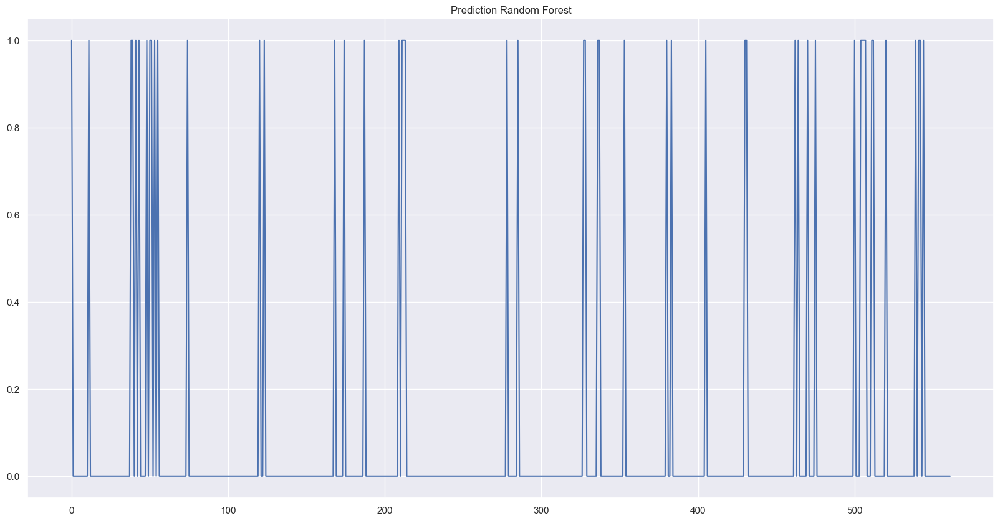

In [67]:
y_pred = pd.DataFrame(y_pred_balanced)
y_pred.index = y_test.index
plt.plot(y_pred_balanced)
plt.title('Prediction Random Forest');

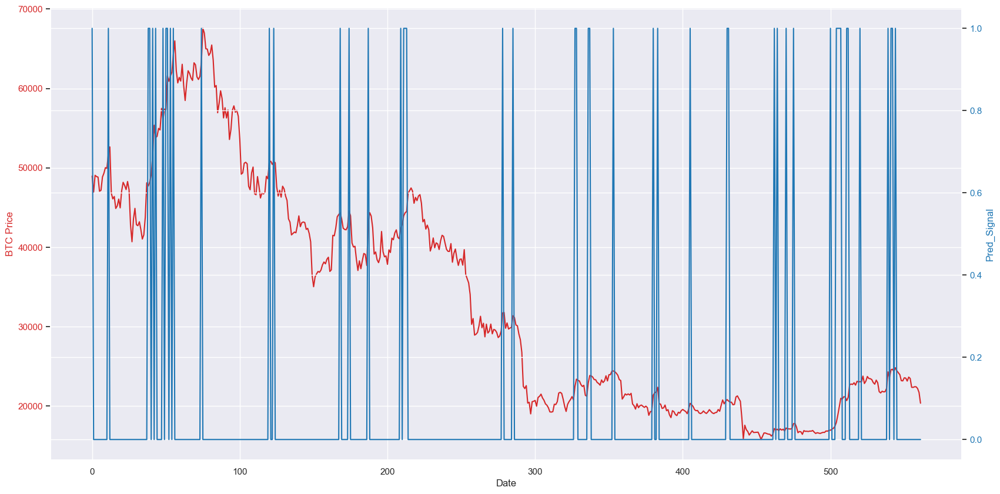

In [44]:
#prepare the data
data = btc_close
data = data.reset_index()
data = data.drop(['Date'],axis=1)
data = data[len(data)-len(y_test):]

data = data.reset_index()


plt.rcParams['figure.figsize'] = (20, 10)
# Set the seaborn style
sns.set(style="darkgrid")

# Create the plot figure and axes
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('BTC Price', color=color)
ax1.plot(data['Close'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Pred_Signal', color=color)  
ax2.plot(y_pred_balanced, color=color)
ax2.tick_params(axis='y', labelcolor=color)

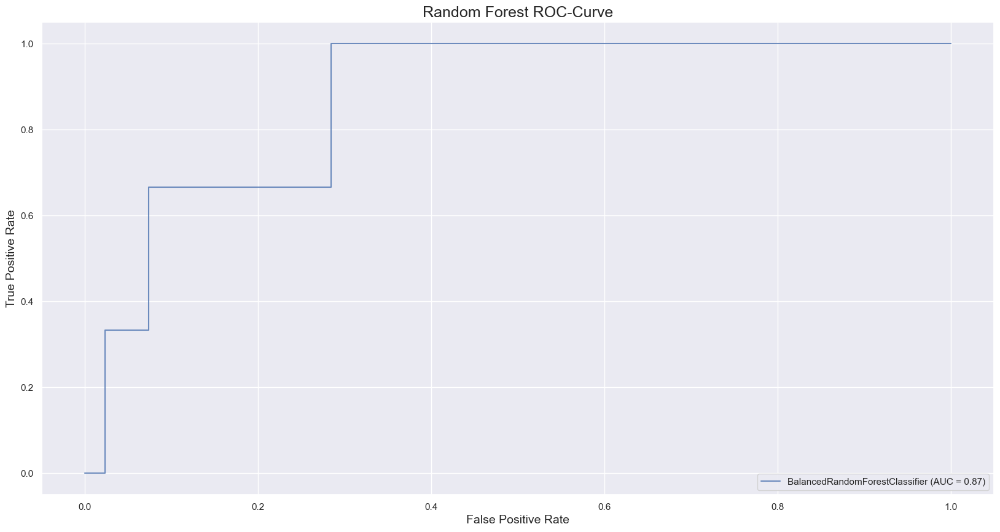

In [72]:
# Create an ROC Curve plot.
rfc_disp = RocCurveDisplay.from_estimator(rand_frst_clf_balanced, X_test, y_test, alpha = 0.8) 
plt.title('Random Forest ROC-Curve', fontsize=18)
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.show()


In [46]:
def mae_metric(actual, predicted):
    actual = actual.to_numpy().flatten()
    predicted = predicted.to_numpy().flatten()
    sum_error = 0.0
    for i in range(len(actual)):
         sum_error += abs(predicted[i] - actual[i])
    return sum_error / float(len(actual))

def rmse_metric(actual, predicted):
    actual = actual.to_numpy().flatten()
    predicted = predicted.to_numpy().flatten()
    
    sum_error = 0.0
    for i in range(len(actual)):
        prediction_error = predicted[i] - actual[i]
        sum_error += (prediction_error ** 2)
    mean_error = sum_error / float(len(actual))
    return np.sqrt(mean_error)



In [47]:
# Print the Accuracy (Hit Ratio) of our Model.
print('Correct Prediction (Hit Ratio) % : ', accuracy_score(y_test, y_pred, normalize = True) * 100.0)

# Checking performance our model with AUC Score.
y_pred_proba = rand_frst_clf_balanced.predict_proba(X_test)[:, 1]  # Get probabilities for the positive class
auc = roc_auc_score(y_test, y_pred_proba)
print('Area under the curve:', auc)

# Get the root mean squared error (RMSE)
print('RMSE = ' , rmse_metric(y_test, y_pred))
# Don't forget the worst value in this case is 1! 

print('MAE = ' , mae_metric(y_test, y_pred))
 

Correct Prediction (Hit Ratio) % :  91.45907473309609
Area under the curve: 0.8729874776386404
RMSE =  0.2922486144860898
MAE =  0.08540925266903915


In [48]:
#Classifiaction Report

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df = pd.DataFrame(report).transpose() 
report_df

,precision,recall,f1-score,support
0.0,0.998051,0.915921,0.955224,559.000000
1.0,0.040816,0.666667,0.076923,3.000000
accuracy,0.914591,0.914591,0.914591,0.914591
macro avg,0.519434,0.791294,0.516073,562.000000
weighted avg,0.992941,0.914591,0.950535,562.000000


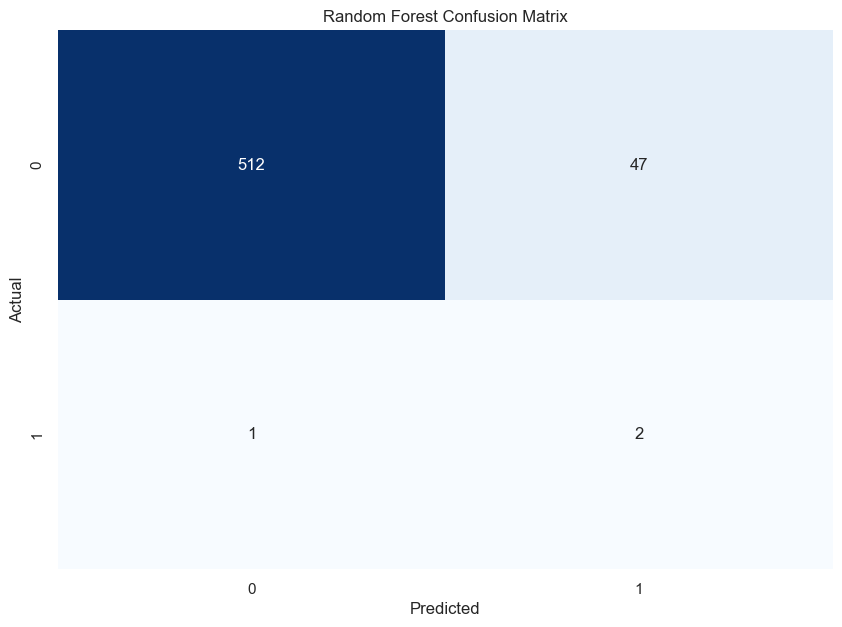

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a heatmap using seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Random Forest Confusion Matrix')

# Display the plot
plt.show()


In [69]:
cm

array([[512,  47],
       [  1,   2]], dtype=int64)

# Robustness Check

In [51]:
#k-fold cross validation evaluation of RF model
kfold = 20
results = cross_val_score(rand_frst_clf_balanced, X_train_resampled, np.ravel(y_train_resampled), cv=kfold)


C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
C:\Users\Danijel\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:86: FutureW

In [52]:
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 82.29% (9.05%)


# Creating the tables of predicted signals

# LPPLS characteristic nochmals programmieren!! (ausversehen gelöscht :( )

In [87]:
y_pred_balanced = pd.DataFrame(y_pred_balanced)
y_pred_balanced = y_pred_balanced.astype(int) #float to integer
index = y_pred_balanced.index
y_pred_xg = pd.DataFrame(y_pred_xg)
y_pred_xg.index = index

In [88]:
#get min and max index 
min_index = y_pred_balanced.index.min()
max_index = y_pred_balanced.index.max()
dates_df = pd.DataFrame(date)

#filter for the test length dates
filtered_dates_df = dates_df.loc[(len(features)+1)-len(y_test):]#dates_df.loc[min_index:max_index]
filtered_dates_df.index = filtered_dates_df['Date']
filtered_dates_df = filtered_dates_df.drop('Date',axis = 1)

#set the index
y_pred_balanced.index = filtered_dates_df.index
y_pred_xg.index = filtered_dates_df.index

In [89]:
def create_signal_dataframe(df):
    """
    This function takes a DataFrame with a binary signal column and returns a new DataFrame containing
    information about each contiguous signal period, including the start date, peak date, and duration.
    """
    
    start_date = None
    duration = 0
    signal_data = []

    # Iterate through the rows of the input DataFrame
    for index, row in df.iterrows():
        signal = row[0]

        # If the current row has a signal and there is no ongoing signal period, start a new signal period
        if signal and start_date is None:
            start_date = index
            duration = 1
        # If the current row has a signal and there is an ongoing signal period, increment the duration
        elif signal and start_date is not None:
            duration += 1
        # If the current row does not have a signal and there is an ongoing signal period, end the signal period
        elif not signal and start_date is not None:
            peak_date = start_date + pd.to_timedelta(duration-1, unit='D')
            signal_data.append([start_date, peak_date, duration])
            start_date = None
            duration = 0

    # If there's an ongoing signal at the end of the DataFrame, add it to the signal_data list
    if start_date is not None:
        peak_date = start_date + pd.to_timedelta(duration-1, unit='D')
        signal_data.append([start_date, peak_date, duration])

    # Create a new DataFrame with the signal_data list and column names "Start", "Peak", and "Duration"
    result_df = pd.DataFrame(signal_data, columns=["Start", "Peak", "Duration"])
    return result_df


In [107]:
y_pred_balanced

,0
Date,
2021-08-25,1
2021-08-26,0
2021-08-27,0
2021-08-28,0
2021-08-29,0
...,...
2023-03-05,0
2023-03-06,0
2023-03-07,0


In [98]:
y_pred_balanced.index = pd.to_datetime(y_pred_balanced.index)
signal_y_pred_balanced_df = create_signal_dataframe(y_pred_balanced)
signal_y_pred_balanced_df

,Start,Peak,Duration
0,2021-08-25,2021-08-25,1
1,2021-09-05,2021-09-05,1
2,2021-10-02,2021-10-03,2
3,2021-10-05,2021-10-05,1
4,2021-10-07,2021-10-07,1
5,2021-10-12,2021-10-12,1
6,2021-10-14,2021-10-15,2
7,2021-10-17,2021-10-17,1
8,2021-10-19,2021-10-19,1
9,2021-11-07,2021-11-07,1


In [99]:
y_pred_xg.index = pd.to_datetime(y_pred_xg.index)
signal_y_pred_xg_df = create_signal_dataframe(y_pred_xg)
signal_y_pred_xg_df

,Start,Peak,Duration
0,2021-09-05,2021-09-05,1
1,2021-10-02,2021-10-03,2
2,2021-10-05,2021-10-05,1
3,2021-10-07,2021-10-08,2
4,2021-10-12,2021-10-12,1
5,2021-10-14,2021-10-15,2
6,2021-10-17,2021-10-17,1
7,2021-11-07,2021-11-07,1
8,2021-12-23,2021-12-23,1
9,2022-02-15,2022-02-15,1


In [115]:
#XGboost Bubbels characteristics
mean_duration_xg = np.mean(signal_y_pred_xg_df['Duration'])
max_duration_xg = np.max(signal_y_pred_xg_df['Duration'])
bubbels_count_xg = len(signal_y_pred_xg_df)

# Convert Start column to datetime if it's not
signal_y_pred_xg_df['Start'] = pd.to_datetime(signal_y_pred_xg_df['Start'])

# Calculate the difference between the current and the next bubble
signal_y_pred_xg_df['Period_Between_Bubbles'] = signal_y_pred_xg_df['Start'].shift(-1) - signal_y_pred_xg_df['Start']

# Compute the mean difference
mean_period_xg = signal_y_pred_xg_df['Period_Between_Bubbles'].mean()


In [116]:
table_xg = pd.DataFrame({
    'Mean_Duration': [mean_duration_xg],
    'Max_Duration': [max_duration_xg],
    'Mean_Period_Between_Bubbles': [mean_period_xg],
    'Number of Bubbels': [bubbels_count_xg]
})

# Print the table
print(table_xg)

   Mean_Duration  Max_Duration Mean_Period_Between_Bubbles  Number of Bubbels
0        1.28125             3  17 days 04:38:42.580645161                 32


In [117]:
#Random Forest Bubbels characteristics
mean_duration_rf = np.mean(signal_y_pred_balanced_df['Duration'])
max_duration_rf = np.max(signal_y_pred_balanced_df['Duration'])
bubbels_count_rf = len(signal_y_pred_balanced_df)
# Convert Start column to datetime if it's not
signal_y_pred_balanced_df['Start'] = pd.to_datetime(signal_y_pred_balanced_df['Start'])

# Calculate the difference between the current and the next bubble
signal_y_pred_balanced_df['Period_Between_Bubbles'] = signal_y_pred_balanced_df['Start'].shift(-1) - signal_y_pred_balanced_df['Start']

# Compute the mean difference
mean_period_rf = signal_y_pred_balanced_df['Period_Between_Bubbles'].mean()


In [118]:
table_rf = pd.DataFrame({
    'Mean_Duration': [mean_duration_rf],
    'Max_Duration': [max_duration_rf],
    'Mean_Period_Between_Bubbles': [mean_period_rf],
    'Number of Bubbels': [bubbels_count_rf]
})

# Print the table
print(table_rf)

   Mean_Duration  Max_Duration Mean_Period_Between_Bubbles  Number of Bubbels
0       1.324324             4            15 days 02:40:00                 37


# Trading 

In [76]:
n = len(y_pred)
X = btc_close
X = X.pct_change().shift(-1) 
X = X[len(X)-n:]
y_pred = pd.DataFrame(y_pred)
X.index = y_pred.index



In [77]:
# Calculate average daily return
avg_daily_return = features['Log_Returns'].mean()
# Calculate standard deviation of daily returns
std_daily_return = features['Log_Returns'].std()
# Calculate daily volatility
daily_volatility = std_daily_return / avg_daily_return
print("The daily volatility of Bitcoin is:", daily_volatility)


The daily volatility of Bitcoin is: 24.69273743035157


In [78]:
#Pred RF
# Transform 0,1 Signal in a -1,1 Signal
trading_signal = np.array(y_pred)
y1 = []
for i in range(0,len(y_pred)):
    if trading_signal[i] > 0:
        y1.append(1)
        
    else:
        y1.append(-1)

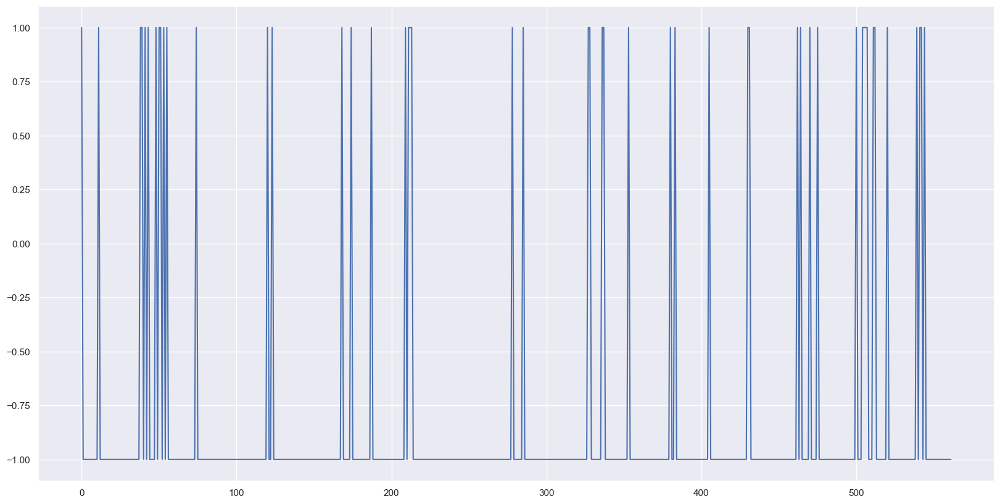

In [79]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.plot(y1)

In [80]:
#long short random forest

perf1_rf = y1 * X

perf1_rf = perf1_rf.dropna()

trading_days_Y = len(y_test) 

perf_sharpe1 = np.sqrt(trading_days_Y) * np.mean(perf1_rf) / (np.sqrt(np.var(perf1_rf)))

In [81]:
#long short xgboost

# Transform 0,1 Signal in a -1,1 Signal
trading_signal = np.array(y_pred_xg)
y1 = []
for i in range(0,len(y_pred_xg)):
    if trading_signal[i] > 0:
        y1.append(1)
        
    else:
        y1.append(-1)

perf1_xg = y1 * X

perf1_xg = perf1_xg.dropna()



perf_sharpexg = np.sqrt(trading_days_Y) * np.mean(perf1_xg) / (np.sqrt(np.var(perf1_xg)))

# Long taktik vs long und cash -> Argumentieren über die umsetzbarkeit (oder kosten der umsetzbarkeit)

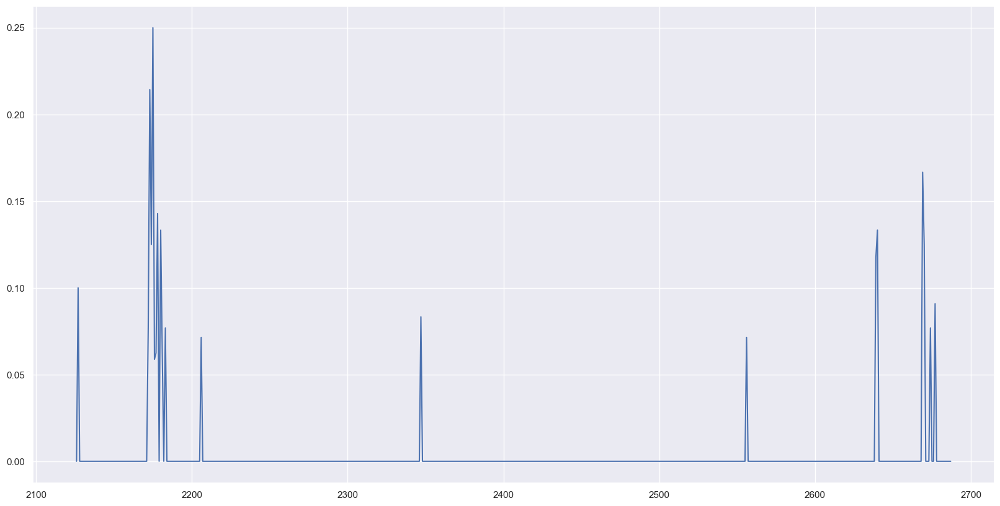

In [93]:
plt.plot(indicator['pos_conf'][len(indicator['pos_conf'])-len(y_test):])

In [83]:
#siGNAL With LPPLS
#Transform Signal in a -1,1 Signal

real_pos_conf = indicator['pos_conf'][len(indicator['pos_conf'])-n:]
trading_signal = np.array(real_pos_conf)
y2 = []
for i in range(0,len(real_pos_conf)):
    if trading_signal[i] > 0:
        y2.append(1)
    else:
        y2.append(-1)

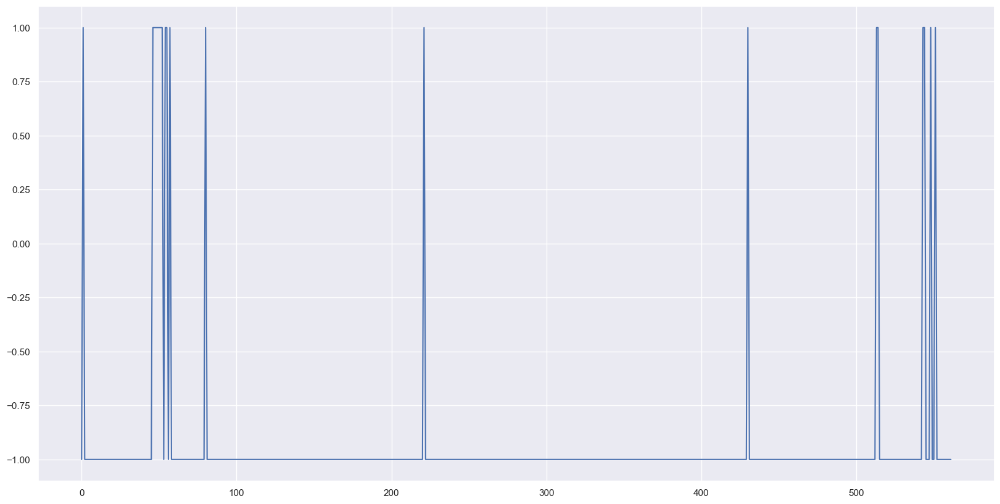

In [84]:
plt.plot(y2)

In [85]:
#long short LPPS model
perf2 = y2 * X

perf2 = perf2.dropna()

perf_sharpe2 = np.sqrt(trading_days_Y) * np.mean(perf2) / (np.sqrt(np.var(perf2)))

In [86]:
#buy and hold
perf3 = X.dropna()

perf_sharpe3 = np.sqrt(trading_days_Y) * np.mean(perf3) / (np.sqrt(np.var(perf3)))

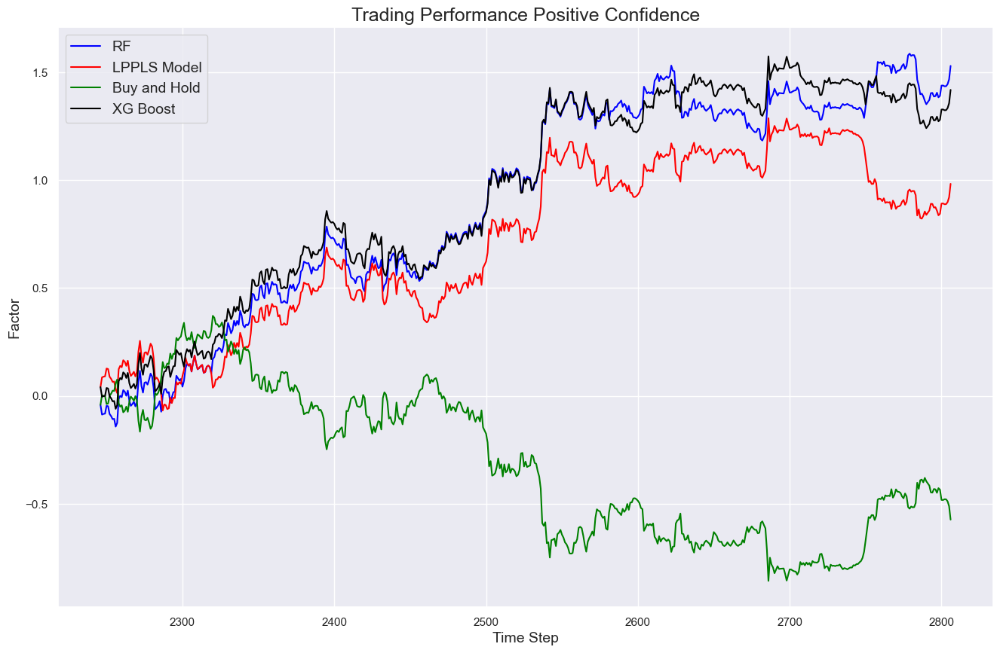

In [87]:
plt.figure(figsize=(16,10))
plt.title('Trading Performance Positive Confidence', fontsize = 18)
plt.ylabel('Factor', fontsize = 14)
plt.xlabel('Time Step', fontsize = 14)
plt.grid(True)
plt.plot(perf1_rf.cumsum() , label='RF', color = 'blue')
plt.plot(perf2.cumsum() , label='LPPLS Model', color = 'red')
plt.plot(perf3.cumsum() , label='Buy and Hold', color = 'green')
plt.plot(perf1_xg.cumsum() , label='XG Boost', color = 'black')
plt.legend(loc='best', fontsize = 14)

*wenn die modelkomplexität hoch ist, overfitting bei RF.*


In [88]:
#Sharpe ratio report und statistics vode performance

In [89]:
def max_drawdown(returns):
    """
    Calculate the maximum drawdown of a series of returns.

    Args:
        returns (array-like): The series of returns.

    Returns:
        float: The maximum drawdown.
    """
    cum_returns = (1 + np.array(returns)).cumprod()
    max_returns = np.maximum.accumulate(cum_returns)
    drawdowns = 1 - cum_returns / max_returns

    return np.max(drawdowns)


In [90]:
#cummulative performance
rf_cum_perf = perf1_rf.cumsum()
xg_cum_perf = perf1_xg.cumsum()
lppls_cum_perf = perf2.cumsum() 
bh_cum_perf = perf3.cumsum() 

#returns
rf_ret = perf1_rf
xg_ret = perf1_xg
lppls_ret = perf2 
bh_ret = perf3 

# Create a dictionary with the return series
data = {
    "rf_ret": rf_ret,
    "xg_ret": xg_ret,
    "lppls_ret": lppls_ret,
    "bh_ret": bh_ret,
}

# Create a DataFrame from the dictionary
returns_df = pd.DataFrame(data)

# Calculate the volatility for each return series
volatility = returns_df.std() * np.sqrt(len(y_test))

#max drawdown
rf_md = max_drawdown(rf_ret)
xg_md = max_drawdown(xg_ret)
lppls_md = max_drawdown(lppls_ret)
bh_md = max_drawdown(bh_ret)

#sharpe Ratios
rf_sp = perf_sharpe1
xg_sp = perf_sharpexg
lppls_sp = perf_sharpe2
bh_sp = perf_sharpe3


# Create a dictionary with the data
performance_data = {
    "Strategy": ["Random Forest", "XGBoost", "LPPLS", "Buy & Hold"],
    "Cumulative Performance": [rf_cum_perf.iloc[-1], xg_cum_perf.iloc[-1], lppls_cum_perf.iloc[-1], bh_cum_perf.iloc[-1]],
    "Maximum Drawdown": [rf_md, xg_md, lppls_md, bh_md],
    "Volatility": [volatility[0],volatility[1],volatility[2],volatility[3]],
    "Sharpe Ratio": [rf_sp, xg_sp, lppls_sp, bh_sp],
}

# Create a DataFrame from the dictionary
table = pd.DataFrame(performance_data)

# Display the table
table

,Strategy,Cumulative Performance,Maximum Drawdown,Volatility,Sharpe Ratio
0,Random Forest,1.529683,0.307976,0.774811,1.979551
1,XGBoost,1.418699,0.305857,0.775188,1.835033
2,LPPLS,0.983128,0.391986,0.776394,1.269663
3,Buy & Hold,-0.572933,0.766346,0.777129,-0.739216


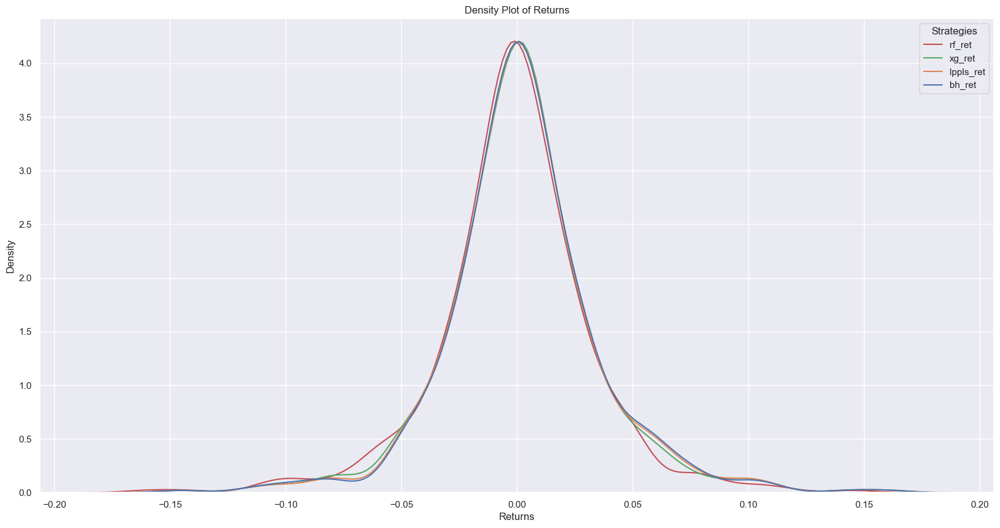

In [91]:
# Plot density returns
sns.kdeplot(data=returns_df)
plt.xlabel("Returns")
plt.ylabel("Density")
plt.legend(returns_df.columns, title="Strategies")
plt.title("Density Plot of Returns")
plt.show()